<a href="https://colab.research.google.com/github/AryanGol/Image2Image/blob/main/UNET_with_TF.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pydicom
import matplotlib.pyplot as plt
import numpy as np
import keras
import tensorflow as tf
from tensorflow.keras.optimizers import Adam
import os
from tensorflow.python.keras.utils.vis_utils import plot_model
from tensorflow.keras.models import Model
from tensorflow.keras.utils import plot_model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import peak_signal_noise_ratio as psnr

import pandas as pd
import zipfile

from tensorflow.keras.applications.vgg16 import VGG16
import keras
from tensorflow.keras.optimizers import Adam

2023-11-22 19:29:00.494190: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.10.1


In [ ]:
import zipfile
zip_file_path = "Mix.zip"

In [ ]:
zip_file_path = "Mix.zip"
# Specify the destination folder where you want to extract the contents
destination_folder = "Unzipped_Mix"

# Open the ZIP file in read mode
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    # Extract all the contents of the ZIP file to the destination folder
    zip_ref.extractall(destination_folder)

In [ ]:
zip_file_path = "Test_Mix.zip"
# Specify the destination folder where you want to extract the contents
destination_folder = "Unzipped_Test_Mix"

# Open the ZIP file in read mode
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    # Extract all the contents of the ZIP file to the destination folder
    zip_ref.extractall(destination_folder)

**MAX based on global MAX**

**Global max in test**

In [ ]:
# Set the path to the "MAC" directory
Test_NAC = 'Unzipped_Test_Mix/Mix/NAC'
Test_MAC = 'Unzipped_Test_Mix/Mix/MAC'

# Get a list of all the DICOM files in the "NAC" and "MAC" directory
Test_NAC = [f for f in os.listdir(Test_NAC)]
Test_NAC = sorted(Test_NAC)
Test_MAC = [e for e in os.listdir(Test_MAC)]
Test_MAC = sorted(Test_MAC)

global_max = 0

for file_name in Test_NAC:
    file_path = os.path.join(NAC_PATH, file_name)
    dcm = pydicom.dcmread(file_path)
    pixel_data = dcm.pixel_array
    global_max = max(global_max, np.max(pixel_data))

for file_name in Test_MAC:
    file_path = os.path.join(MAC_PATH, file_name)
    dcm = pydicom.dcmread(file_path)
    pixel_data = dcm.pixel_array
    global_max = max(global_max, np.max(pixel_data))

In [ ]:
import numpy as np
import pydicom
import os

IMG_WIDTH = 256
IMG_HEIGHT = 256
IMG_CHANNELS = 3

NAC_PATH = 'Unzipped_Mix/Mix/NAC'
MAC_PATH = 'Unzipped_Mix/Mix/MAC'

files_nac = [f for f in os.listdir(NAC_PATH) if f.endswith('.dcm')]
files_nac = sorted(files_nac)

files_mac = [e for e in os.listdir(MAC_PATH) if e.endswith('.dcm')]
files_mac = sorted(files_mac)

X_train = np.zeros((len(files_nac), IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS), dtype=np.float32)
Y_train = np.zeros((len(files_mac), IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS), dtype=np.float32)

# Step 1: Find the global maximum pixel value across all slices
#global_max = 0

for file_name in files_nac:
    file_path = os.path.join(NAC_PATH, file_name)
    dcm = pydicom.dcmread(file_path)
    pixel_data = dcm.pixel_array
    global_max = max(global_max, np.max(pixel_data))

for file_name in files_mac:
    file_path = os.path.join(MAC_PATH, file_name)
    dcm = pydicom.dcmread(file_path)
    pixel_data = dcm.pixel_array
    global_max = max(global_max, np.max(pixel_data))

# Step 2: Normalize each slice using the global maximum
for i, file_name in enumerate(files_nac):
    file_path = os.path.join(NAC_PATH, file_name)
    dcm = pydicom.dcmread(file_path)
    pixel_data = dcm.pixel_array
    pixel_data = (pixel_data) / global_max
    rgb_image = np.tile(pixel_data[:, :, np.newaxis], [1, 1, IMG_CHANNELS])
    X_train[i] = rgb_image

for j, file_name1 in enumerate(files_mac):
    file_path1 = os.path.join(MAC_PATH, file_name1)
    dcm1 = pydicom.dcmread(file_path1)
    pixel_data1 = dcm1.pixel_array
    pixel_data1 = (pixel_data1) / global_max
    rgb_image1 = np.tile(pixel_data1[:, :, np.newaxis], [1, 1, IMG_CHANNELS])
    Y_train[j] = rgb_image1

print('X_train shape:', X_train.shape)
print('Y_train shape:', Y_train.shape)

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
# Define the data augmentation parameters
datagen = ImageDataGenerator(
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.1,
    zoom_range=0.1,
    #horizontal_flip=True,
    fill_mode='constant')

# Fit the data generator to the training data
datagen.fit(X_train)

# Generate augmented images and add them to X_train and Y_train
for X_batch, Y_batch in datagen.flow(X_train, Y_train, batch_size=len(X_train)):
    X_train = np.concatenate((X_train, X_batch))
    Y_train = np.concatenate((Y_train, Y_batch))
    break

# Print the new shape of X_train and Y_train
print('X_train shape after augmentation:', X_train.shape)
print('Y_train shape after augmentation:', Y_train.shape)

X_train shape after augmentation: (6862, 256, 256, 3)
Y_train shape after augmentation: (6862, 256, 256, 3)


In [ ]:
def dice_coefficient(y_true, y_pred, smooth=1):
    intersection = tf.reduce_sum(y_true * y_pred)
    union = tf.reduce_sum(y_true) + tf.reduce_sum(y_pred)
    dice = (2.0 * intersection + smooth) / (union + smooth)
    return dice

In [ ]:
import tensorflow as tf
from skimage.metrics import structural_similarity as ssim  # for SSIM
import numpy as np

# Mean Absolute Error (MAE)
def mean_absolute_error(y_true, y_pred):
    return 1-(tf.reduce_mean(tf.abs(y_true - y_pred)))

# Structural Similarity Index (SSIM)
def structural_similarity_index(y_true, y_pred, data_range=1.0):
    # Convert tensors to numpy arrays
    y_true_np = y_true()
    y_pred_np = y_pred()

    # Ensure the images have the same shape and data type
    y_true_np = np.asarray(y_true_np, dtype=np.float64)
    y_pred_np = np.asarray(y_pred_np, dtype=np.float64)

    # Compute SSIM
    index, _ = ssim(y_true_np, y_pred_np, full=True, data_range=data_range)
    return tf.convert_to_tensor(index, dtype=tf.float32)

# Peak Signal-to-Noise Ratio (PSNR)
def peak_signal_to_noise_ratio(y_true, y_pred, max_value=1.0):
    mse = tf.reduce_mean(tf.square(y_true - y_pred))
    psnr = 20 * tf.math.log(max_value / tf.math.sqrt(mse)) / tf.math.log(10.0)
    return psnr


In [ ]:
import tensorflow as tf
from tensorflow.keras.applications.vgg16 import VGG16
IMG_HEIGHT=256
IMG_WIDTH = 256
IMG_CHANNELS = 3
# Load the pre-trained VGG16 model trained on ImageNet
vgg16 = VGG16(weights='imagenet', include_top=False, input_shape=(IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))

# Freeze the weights of the VGG16 model
vgg16.trainable = False

# Get the output of the last convolutional layer in VGG16
vgg16_output = vgg16.get_layer('block5_conv3').output

# Contraction path
p444 = vgg16_output

c555 = tf.keras.layers.Conv2D(512, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p444)
c555 = tf.keras.layers.BatchNormalization()(c555)
c555 = tf.keras.layers.Dropout(0.3)(c555)
c555 = tf.keras.layers.Conv2D(512, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c555)
c555 = tf.keras.layers.BatchNormalization()(c555)

# Expansive path
u666 = tf.keras.layers.Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(c555)
u666 = tf.keras.layers.concatenate([u666, vgg16.get_layer('block4_conv3').output])
c666 = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u666)
c666 = tf.keras.layers.BatchNormalization()(c666)
c666 = tf.keras.layers.Dropout(0.2)(c666)
c666 = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c666)
c666 = tf.keras.layers.BatchNormalization()(c666)

u777 = tf.keras.layers.Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c666)
u777 = tf.keras.layers.concatenate([u777, vgg16.get_layer('block3_conv3').output])
c777 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u777)
c777 = tf.keras.layers.BatchNormalization()(c777)
c777 = tf.keras.layers.Dropout(0.2)(c777)
c777 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c777)
c777 = tf.keras.layers.BatchNormalization()(c777)

u888 = tf.keras.layers.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c777)
u888 = tf.keras.layers.concatenate([u888, vgg16.get_layer('block2_conv2').output])
c888 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u888)
c888 = tf.keras.layers.BatchNormalization()(c888)
c888 = tf.keras.layers.Dropout(0.1)(c888)
c888 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c888)
c888 = tf.keras.layers.BatchNormalization()(c888)

u999 = tf.keras.layers.Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(c888)
u999 = tf.keras.layers.concatenate([u999, vgg16.get_layer('block1_conv2').output], axis=3)
c999 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u999)
c999 = tf.keras.layers.BatchNormalization()(c999)
c999 = tf.keras.layers.Dropout(0.1)(c999)
c999 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c999)
c999 = tf.keras.layers.BatchNormalization()(c999)

outputs3 = tf.keras.layers.Conv2D(3, (1, 1), activation='sigmoid')(c999)

model2 = tf.keras.Model(inputs=[vgg16.input], outputs=[outputs3])
model2.compile(optimizer=Adam(lr=0.001),loss='MSE', metrics='accuracy')
model2.summary()

2023-11-22 19:29:48.459615: I tensorflow/compiler/jit/xla_cpu_device.cc:41] Not creating XLA devices, tf_xla_enable_xla_devices not set
2023-11-22 19:29:48.460994: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcuda.so.1
2023-11-22 19:29:49.212881: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1720] Found device 0 with properties: 
pciBusID: 0000:65:00.0 name: Quadro RTX 8000 computeCapability: 7.5
coreClock: 1.77GHz coreCount: 72 deviceMemorySize: 47.46GiB deviceMemoryBandwidth: 625.94GiB/s
2023-11-22 19:29:49.212951: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.10.1
2023-11-22 19:29:49.215879: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcublas.so.10
2023-11-22 19:29:49.216039: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcublasLt.so.10
2023-1

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
block1_conv1 (Conv2D)           (None, 256, 256, 64) 1792        input_1[0][0]                    
__________________________________________________________________________________________________
block1_conv2 (Conv2D)           (None, 256, 256, 64) 36928       block1_conv1[0][0]               
__________________________________________________________________________________________________
block1_pool (MaxPooling2D)      (None, 128, 128, 64) 0           block1_conv2[0][0]               
______________________________________________________________________________________________

In [ ]:
results2 = model2.fit(X_train, Y_train, batch_size=47, validation_split=0.1, epochs=200)

2023-11-22 19:29:53.165287: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:116] None of the MLIR optimization passes are enabled (registered 2)
2023-11-22 19:29:53.184319: I tensorflow/core/platform/profile_utils/cpu_utils.cc:112] CPU Frequency: 3699850000 Hz


Epoch 1/200


2023-11-22 19:29:54.414004: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudnn.so.7
2023-11-22 19:29:55.170216: W tensorflow/stream_executor/gpu/asm_compiler.cc:63] Running ptxas --version returned 256
2023-11-22 19:29:55.218480: W tensorflow/stream_executor/gpu/redzone_allocator.cc:314] Internal: ptxas exited with non-zero error code 256, output: 
Relying on driver to perform ptx compilation. 
Modify $PATH to customize ptxas location.
This message will be only logged once.
2023-11-22 19:29:55.826411: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcublas.so.10


132/132 [==============================] - 113s 667ms/step - loss: 0.2697 - accuracy: 0.1973 - val_loss: 0.0830 - val_accuracy: 0.8539
Epoch 2/200
132/132 [==============================] - 54s 409ms/step - loss: 0.0837 - accuracy: 0.0982 - val_loss: 0.0427 - val_accuracy: 0.0444
Epoch 3/200
132/132 [==============================] - 55s 415ms/step - loss: 0.0483 - accuracy: 0.0732 - val_loss: 0.0389 - val_accuracy: 0.0367
Epoch 4/200
132/132 [==============================] - 55s 417ms/step - loss: 0.0375 - accuracy: 0.0661 - val_loss: 0.0337 - val_accuracy: 0.0191
Epoch 5/200
132/132 [==============================] - 55s 417ms/step - loss: 0.0319 - accuracy: 0.0673 - val_loss: 0.0395 - val_accuracy: 0.0478
Epoch 6/200
132/132 [==============================] - 55s 417ms/step - loss: 0.0275 - accuracy: 0.0689 - val_loss: 0.0441 - val_accuracy: 0.3809
Epoch 7/200
132/132 [==============================] - 55s 418ms/step - loss: 0.0245 - accuracy: 0.0555 - val_loss: 0.0304 - val_accura

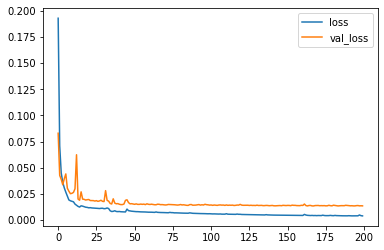

In [ ]:
plt.plot(results2.history['loss'])
plt.plot(results2.history['val_loss'])
plt.legend(['loss','val_loss'])

In [ ]:
a = results2.history['loss']
b = results2.history['val_loss']

In [ ]:
from numpy import asarray
from numpy import savetxt
# define data
a = asarray(a)
# save to csv file
savetxt('UNET_TF_loss.csv', a)
b = asarray(b)
# save to csv file
savetxt('UNET_TF_Val_loss.csv', b)

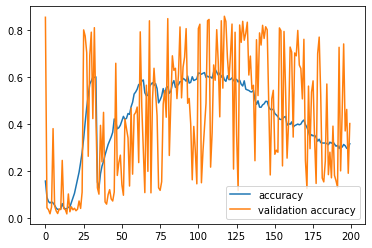

In [ ]:
plt.plot(results2.history['accuracy'])
plt.plot(results2.history['val_accuracy'])
plt.legend(['accuracy','validation accuracy'])

In [ ]:
c = results2.history['accuracy']
d = results2.history['val_accuracy']

In [ ]:
from numpy import asarray
from numpy import savetxt
# define data
c = asarray(c)
# save to csv file
savetxt('UNET_TF_accuracy.csv', c)
d = asarray(d)
# save to csv file
savetxt('UNET_TF_Val_accuracy.csv', d)

In [ ]:
model2.save('UNET_TF_Mix.h5')

In [ ]:
NAC_Test_12 = 'Unzipped_Test_Mix/Mix/NAC'
MAC_Test_12 = 'Unzipped_Test_Mix/Mix/MAC'

# Get a list of all the DICOM files in the "NAC" and "MAC" directory
files4 = [f for f in os.listdir(NAC_Test_12)]
files4 = sorted(files4)
files5 = [e for e in os.listdir(MAC_Test_12)]
files5 = sorted(files5)
# Create an empty array to store the images
X_test_12 = np.zeros((len(files4), 256, 256, 3), dtype=np.float32)
Y_test_12 = np.zeros((len(files5), 256, 256, 3), dtype=np.float32)

# Loop over each DICOM file and read the image
for i, file_name4 in enumerate(files4):
    # Construct the full path to the DICOM file
    file_path4 = os.path.join(NAC_Test_12, file_name4)
    # Read the DICOM file and extract the pixel data
    dcm4 = pydicom.dcmread(file_path4)
    pixel_data4 = dcm4.pixel_array
    # Rescale the pixel values to be between 0 and 1
    pixel_data4 = (pixel_data4) / (np.max(pixel_data4))
    rgb_image4 = np.tile(pixel_data4[:, :, np.newaxis], [1, 1, 3])
    # Add the pixel data to the X_train array
    X_test_12[i] = rgb_image4

for j, file_name5 in enumerate(files5):
    # Construct the full path to the DICOM file
    file_path5 = os.path.join(MAC_Test_12, file_name5)
    # Read the DICOM file and extract the pixel data
    dcm5 = pydicom.dcmread(file_path5)
    pixel_data5 = dcm5.pixel_array
    # Rescale the pixel values to be between 0 and 1
    pixel_data5 = (pixel_data5) / (np.max(pixel_data5))
    rgb_image5 = np.tile(pixel_data5[:, :, np.newaxis], [1, 1, 3])
    # Add the pixel data to the X_train array
    Y_test_12[j, :, :, 0] = pixel_data5

# Print the shape of the X_train array
print('X_test_12 shape:', X_test_12.shape)
print('Y_test_12 shape:', Y_test_12.shape)

X_test_12 shape: (282, 256, 256, 3)
Y_test_12 shape: (282, 256, 256, 3)


In [ ]:
predicted_images_12 = np.zeros((len(files4), 256, 256, 3), dtype=np.float32)
for i in range(len(files4)):
    # Get the input image from X_test
    input_image_12 = X_test_12[i]
    input_image_12 = np.expand_dims(input_image_12, axis=0)  # Add an extra dimension for the batch size

    # Perform the prediction using your U-Net algorithm
    predicted_image_12 = model2(input_image_12)  # Replace 'your_unet_algorithm' with your actual prediction function
    predicted_image_12 = np.squeeze(predicted_image_12, axis=0)
    # Store the predicted image in the array
    predicted_images_12[i] = predicted_image_12

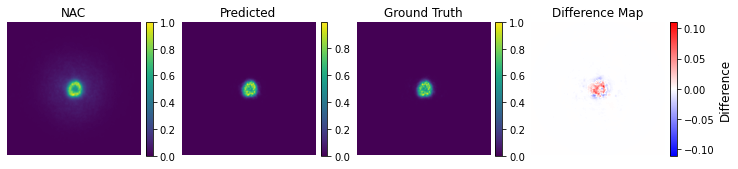

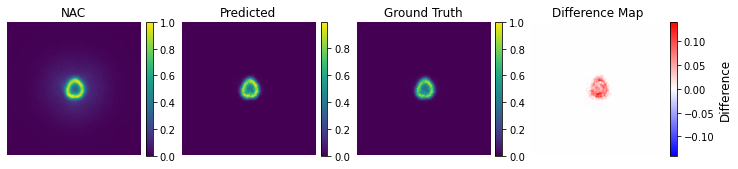

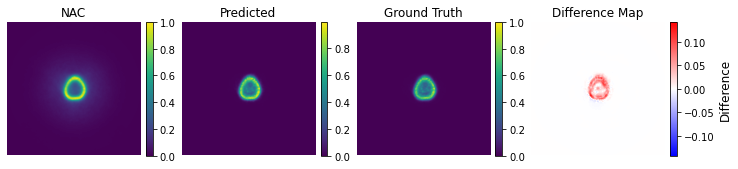

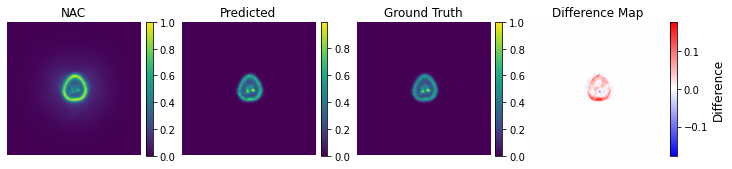

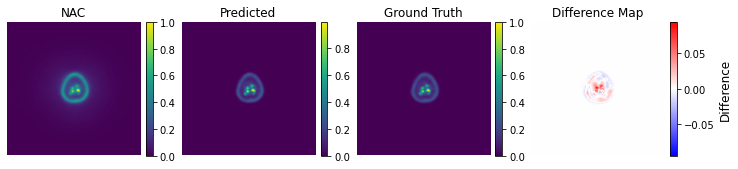

...

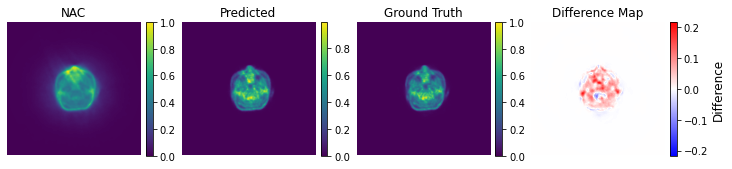

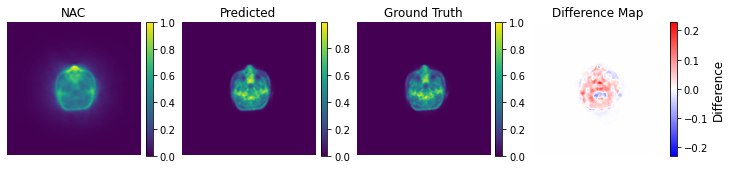

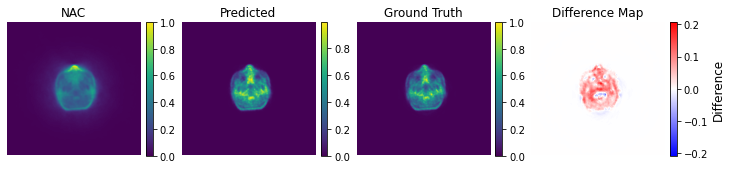

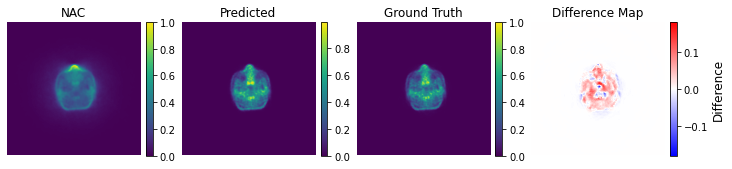

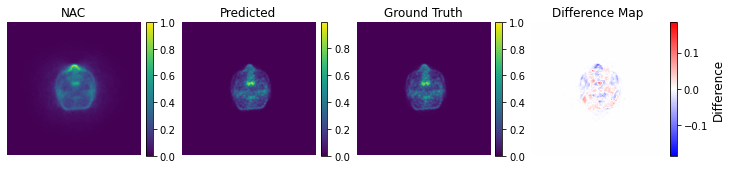

In [ ]:
import matplotlib.pyplot as plt

# Loop over the predicted images and plot them separately
for i in range(len(files4)):
    # Create a new figure for each predicted image and its ground truth
    fig, axes = plt.subplots(1, 4, figsize=(12, 6))

    # Get the predicted image and ground truth
    predicted_image_test = predicted_images_12[i]/(np.max(predicted_images_12[i]))
    ground_truth_image_12 = Y_test_12[i]
    # They doesn't have any data in B and G layers, cause our output of model was actually one layer, but we have to choose the R channel
    predicted_image_test = predicted_image_test[:,:,0]
    ground_truth_image_12 = ground_truth_image_12[:,:,0]

    difference_map = predicted_image_test - ground_truth_image_12
    # Plot the predicted image
    im = axes[0].imshow(X_test_12[i][:,:,0].squeeze())
    axes[0].axis('off')
    axes[0].set_title('NAC'.format(i))
    cbar = fig.colorbar(im, ax=axes[0], fraction=0.046, pad=0.04)

    im1 = axes[1].imshow(predicted_image_test.squeeze())
    axes[1].axis('off')
    axes[1].set_title('Predicted'.format(i))
    cbar2 = fig.colorbar(im1, ax=axes[1], fraction=0.046, pad=0.04)

    # Plot the ground truth image
    im2 = axes[2].imshow(ground_truth_image_12.squeeze())
    axes[2].axis('off')
    axes[2].set_title('Ground Truth')
    cbar3 = fig.colorbar(im2, ax=axes[2], fraction=0.046, pad=0.04)



    cmap = plt.cm.bwr  # Choose a colormap (e.g., 'bwr' for blue-white-red)
    norm = plt.Normalize(vmin=-np.max(np.abs(difference_map)), vmax=np.max(np.abs(difference_map)))
    img3 = axes[3].imshow(difference_map, cmap=cmap, norm=norm)
    axes[3].axis('off')
    axes[3].set_title('Difference Map')
    cbar4 = fig.colorbar(img3, fraction=0.046, pad=0.04)
    cbar4.set_label("Difference", fontsize=12)
    # Show the figure
    plt.show()